# [Image Processing in Python](https://neptune.ai/blog/image-processing-python)

## What is image processing?

이미지 처리는 이미지를 처리하는 것을 의미하며 여기에는 목표에 도달할 때까지 다양한 기술이 포함될 수 있습니다.

- 이미지 데이터란?    
이미지는 x,y 및 z가 공간 좌표가 되는 3D로 표현할 수 있습니다. 픽셀은 메트릭스 형태로 배열됩니다.  

- 이미지 유형
    - 컬러 이미지: 2D 이미지의 3개 레이어를 포함하며 이 레이어는 Red, Green 및 Blue 채널입니다.
    - 그레이스케일 이미지: 2D 이미지의 단일 레이어(단일 채널)입니다.

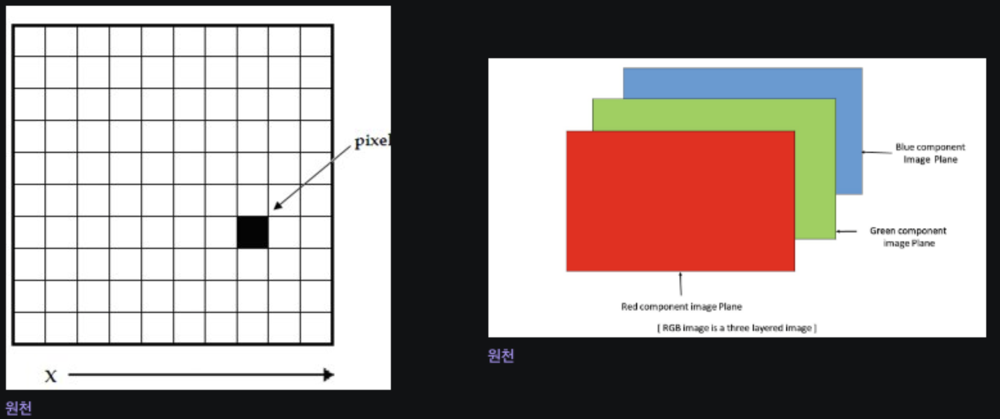

# Classic image processing algorithms

## 1.Morphological Image Processing
> 형태학적 이미지 처리

형태학적 이미지 처리의 두 가지 기본 작업인 확장 및 침식을 살펴보겠습니다.
- Dilation(확장): 이미지에서 객체의 경계에 픽셀을 추가합니다.
- Erosion(침식): 이미지에서 객체 경계에서 픽셀을 제거합니다.

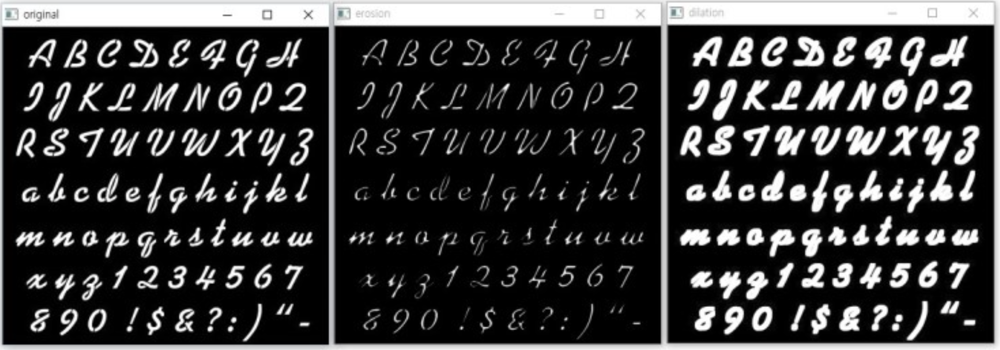

- [Erosion(침식) 작동 원리](https://blog.naver.com/samsjang/220505815055)

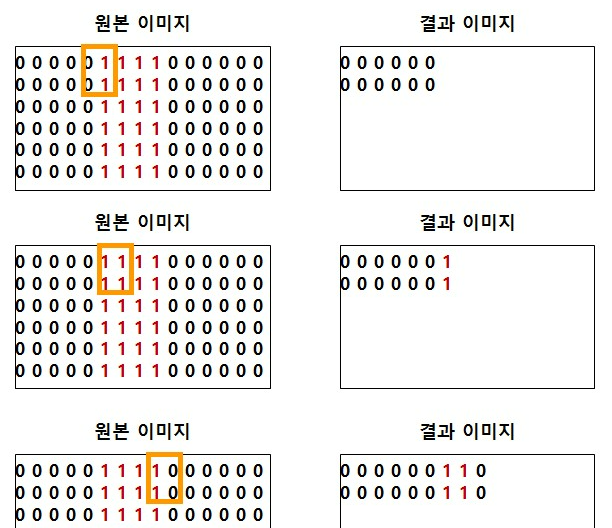

## 2.Gaussian Image Processing
> 가우시안 평활화라고도 하는 가우시안 블러는 가우시안 함수로 이미지를 블러링한 결과이다.

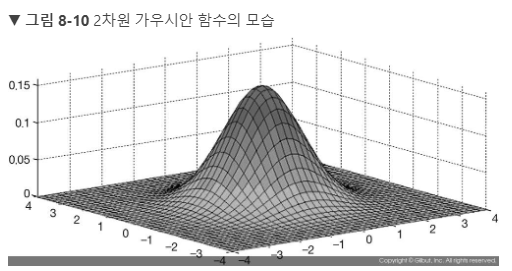

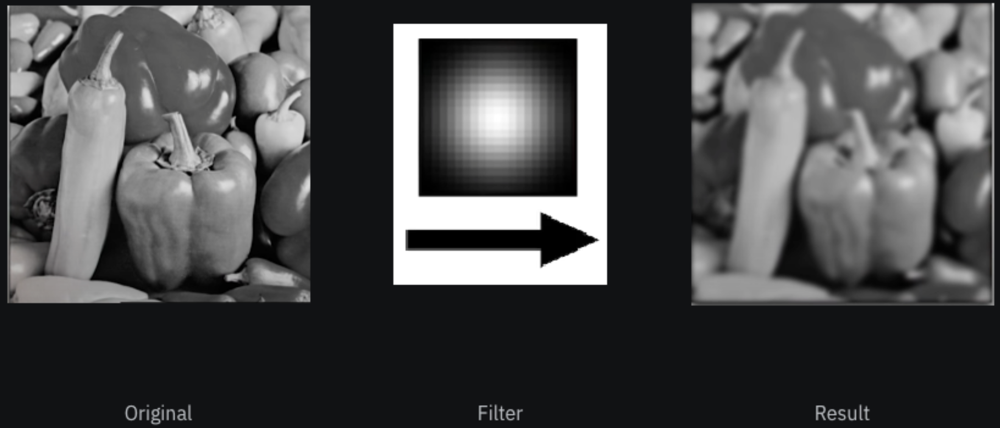

## 3.Edge Detection in image processing
> 엣지 검출은 이미지 내 객체의 경계를 찾기 위한 이미지 처리 기술입니다. 밝기의 불연속성을 감지하여 작동합니다.

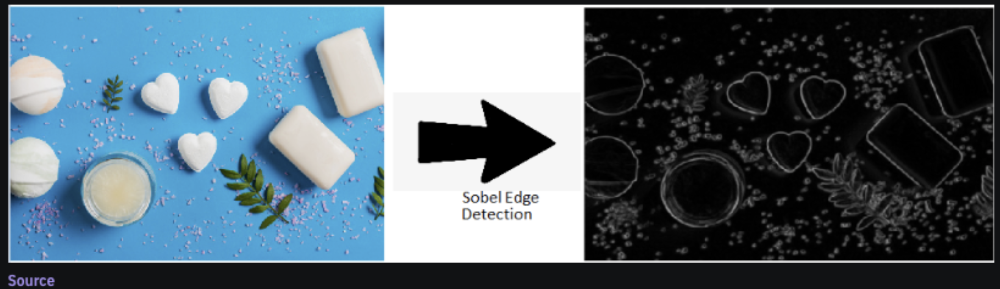

# Image processing using Neural Networks

## Convolutional Neural Network
> 컨볼루션 신경망은 아래 이미지와 같이 일반적으로 세 개의 레이어로 구성되어 있습니다.   
> Convolutional layer, Pooling layer, Fully connected layer

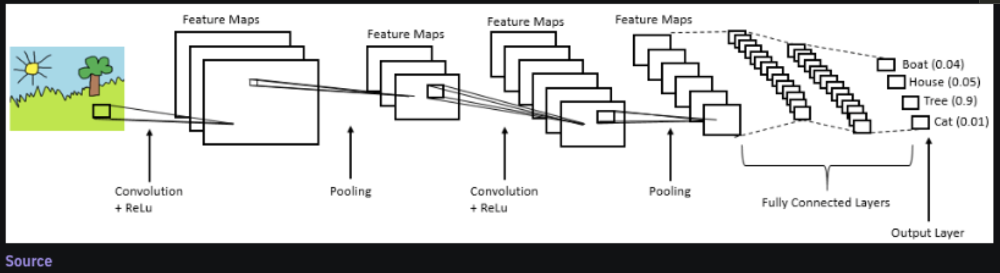

# [Image Augmentation](https://pytorch.org/vision/main/auto_examples/index.html)

심층 신경망에서 데이터셋을 사용할 경우 대규모 데이터셋일수록 모델의 의존도를 줄일 수 있고, 이에 따른 이반화 능력이 향상된다.     
따라서 심층 신경망의 성공적인 학습을 위해 동일한 이미지를 `위치, 밝기, 색도`와 같은 요소들을 무작위로 조절하면서 다양한 데이터를 만드는 것이다.     
이러한 이미지 확대 기술은 심층 신경망의 성공에 크게 기여를 했으며, 이미지를 무작위로 변환해주는 작업은 다양한 모듈에서 제공을 해주고 있다.

In [1]:
# 구글 드라이브 연결(데이터 로드를 위해서)
from google.colab import drive
drive.mount('/content/data')

Mounted at /content/data


In [2]:
import easydict
import json
args = easydict.EasyDict()

# path 정보
args.default_path = '/content/data/MyDrive/ai_lecture/2. Deep Learning/2. Vision Pytorch/Image_Preprocessing/data/'

In [3]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
plt.rcParams["savefig.bbox"] = 'tight'
plt.ion()

import numpy as np

import torch
import torchvision.transforms as T

torch.manual_seed(0)

In [4]:
orig_img = Image.open(args.default_path+'deer.jpg')

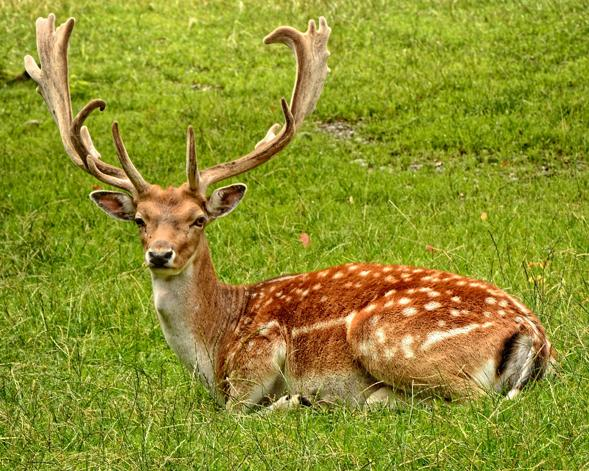

In [5]:
orig_img

In [24]:
def plot(imgs:list, with_orig:bool=True, row_title:str=None, **imshow_kwargs):
    # isinstance(i,j) -> i의 데이터 타입이 j와 같은지 아닌지 판단하는 함수
    # imgs[0] -> PIL(이미지 데이터) ->
    if not isinstance(imgs[0], list): # imgs가 메트릭스???
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs] # imgs를 메트릭스로 변경!!!

    num_rows = len(imgs) # 로우 길이
    num_cols = len(imgs[0]) + with_orig # 컬럼 길이

    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False, figsize=(10,15))

    # enumerate() -> index와 요소값이 리턴되는 함수
    for row_idx, row in enumerate(imgs): # row 단위로 이미지 데이터 조회

        row = [orig_img] + row if with_orig else row # (만약 있다면) 오리지날 데이터 추가

        for col_idx, img in enumerate(row): # col 단위로 이미지 데이터 조회

            ax = axs[row_idx, col_idx] # axs에서 row index, col index를 이용하여 ax 선택하기
            ax.imshow(np.asarray(img), **imshow_kwargs) # ax에 이미지 그리기
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig: # 오리지날 이미지에 타이틀 달기
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows): # 타이틀이 있다면 적용!!
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

## Pad

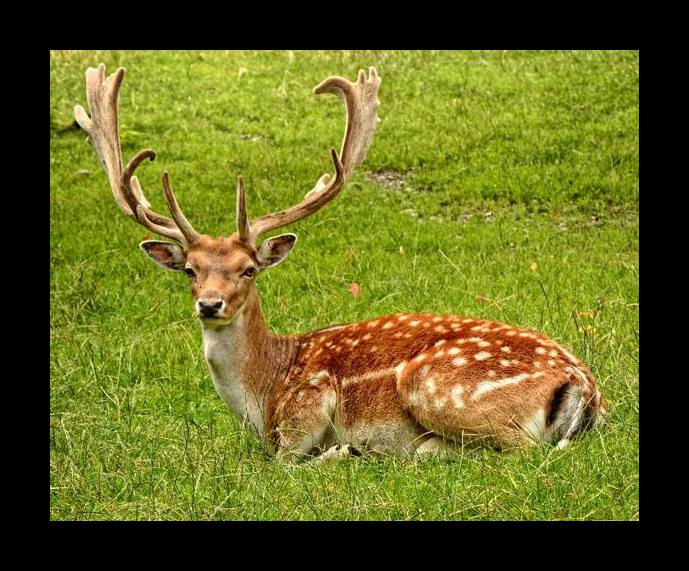

In [9]:
T.Pad(padding=50)(orig_img)

In [25]:
padded_imgs = [T.Pad(padding=padding)(orig_img) for padding in (3, 10, 30, 50)]
padded_imgs

[<PIL.Image.Image image mode=RGB size=595x477>,
 <PIL.Image.Image image mode=RGB size=609x491>,
 <PIL.Image.Image image mode=RGB size=649x531>,
 <PIL.Image.Image image mode=RGB size=689x571>]

In [22]:
import numpy as np

type(padded_imgs[0]), type(np.array(padded_imgs[0]))

(PIL.Image.Image, numpy.ndarray)

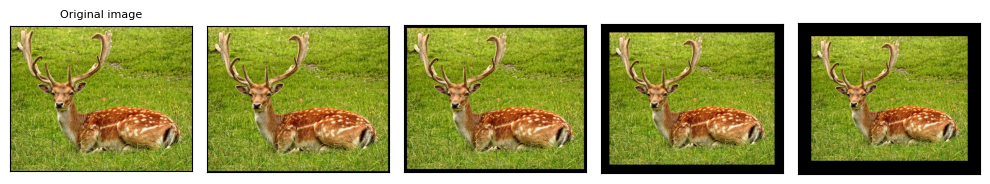

In [26]:
plot(padded_imgs)

## Resize

In [11]:
# (height, width)
orig_img.size

(589, 471)

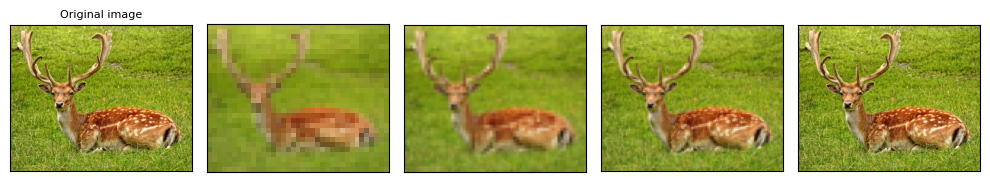

In [10]:
resized_imgs = [T.Resize(size=size)(orig_img) for size in (30, 50, 100, orig_img.size[0])]
plot(resized_imgs)

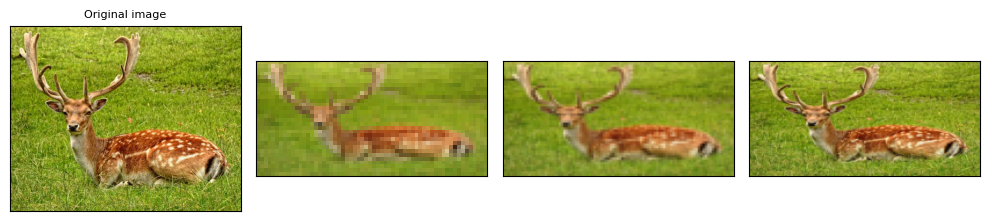

In [13]:
resized_imgs = [T.Resize(size=size)(orig_img) for size in
      ((30, 60), (50, 100), (100, 200))]
plot(resized_imgs)

## CenterCrop

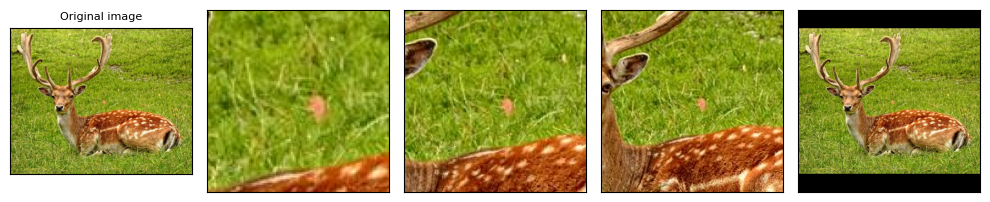

In [15]:
center_crops = [T.CenterCrop(size=size)(orig_img) for size in (100, 150, 200, orig_img.size[0])]
plot(center_crops)

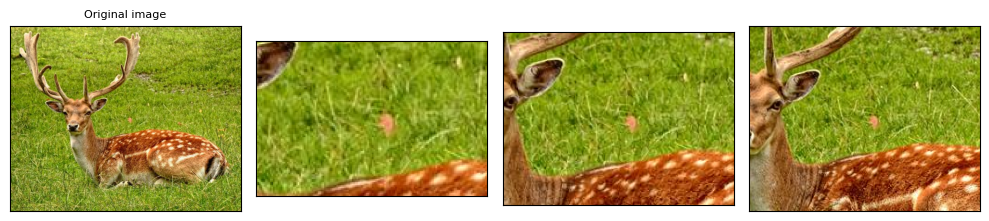

In [16]:
center_crops = [T.CenterCrop(size=size)(orig_img) for size in (
    (100, 150), (150, 200), (200, 250))]
plot(center_crops)

## FiveCrop

In [27]:
(top_left, top_right, bottom_left, bottom_right, center) = T.FiveCrop(size=(100, 100))(orig_img)

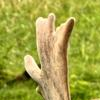

In [31]:
top_left

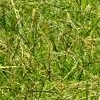

In [32]:
bottom_left

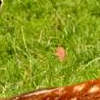

In [30]:
center

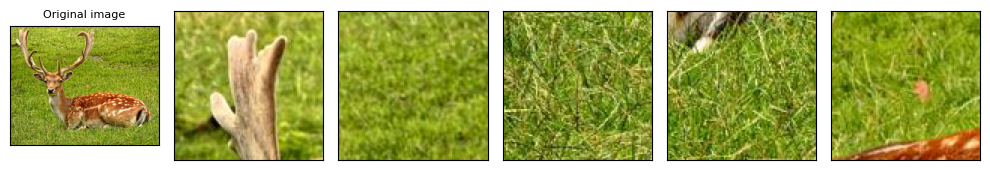

In [ ]:
(top_left, top_right, bottom_left, bottom_right, center) = T.FiveCrop(size=(100, 100))(orig_img)
plot([top_left, top_right, bottom_left, bottom_right, center])

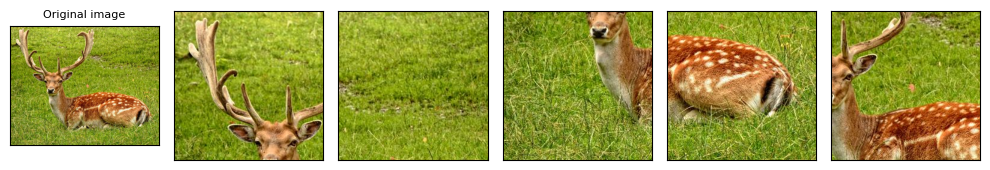

In [34]:
(top_left, top_right, bottom_left, bottom_right, center) = T.FiveCrop(size=(250, 250))(orig_img)
plot([top_left, top_right, bottom_left, bottom_right, center])

## Grayscale

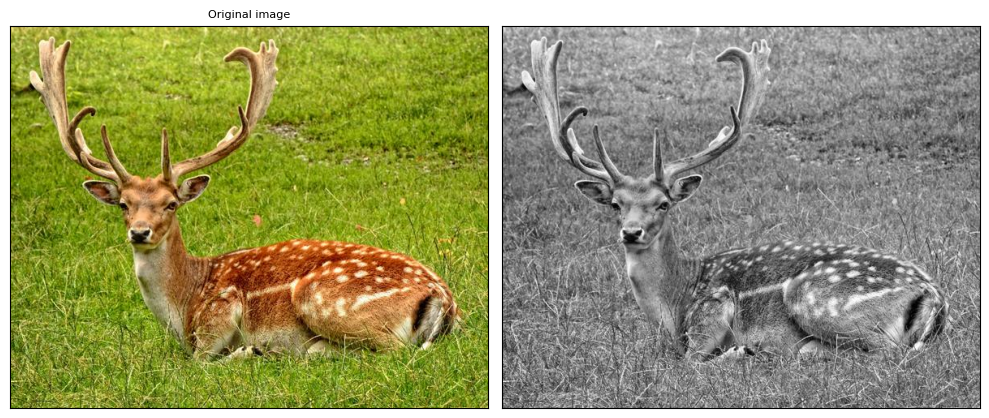

In [37]:
gray_img = T.Grayscale()(orig_img)
plot([gray_img], cmap='gray')

## Random transforms
> The following transforms are random, which means that the same transfomer instance will produce different result each time it transforms a given image.

### Color Jitter
> The `ColorJitter` transform randomly changes the brightness, saturation, and other properties of an image.

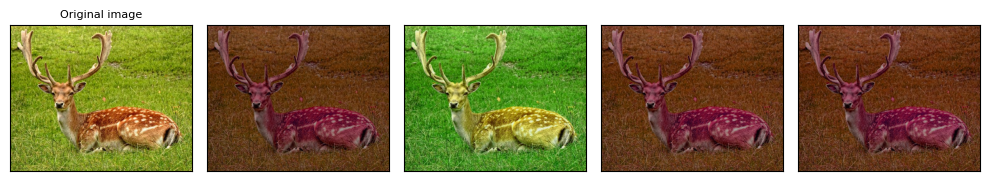

In [38]:
jitter = T.ColorJitter(brightness=.5, hue=.3)
jitted_imgs = [jitter(orig_img) for _ in range(4)]
plot(jitted_imgs)

### GaussianBlur

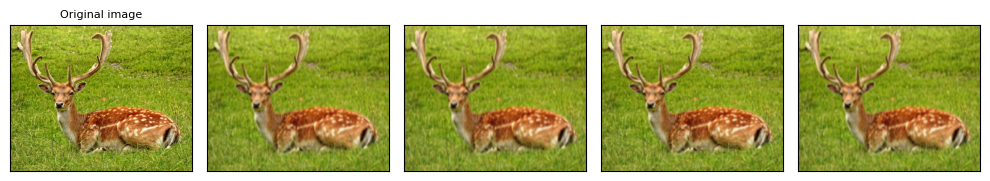

In [39]:
blurrer = T.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))
blurred_imgs = [blurrer(orig_img) for _ in range(4)]
plot(blurred_imgs)

### RandomPerspective

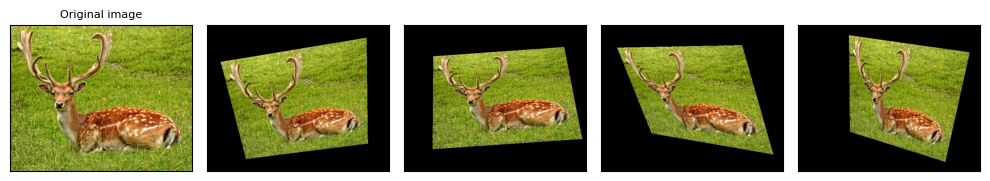

In [40]:
perspective_transformer = T.RandomPerspective(distortion_scale=0.6, p=1.0)
perspective_imgs = [perspective_transformer(orig_img) for _ in range(4)]
plot(perspective_imgs)

### RandomRotation

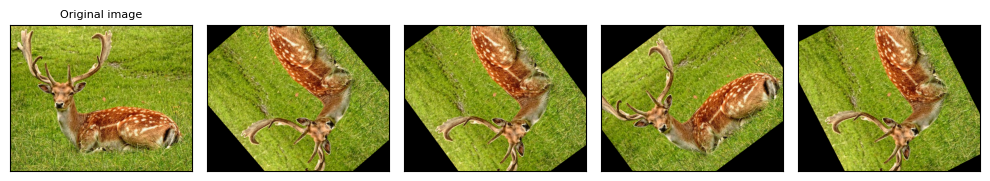

In [41]:
rotater = T.RandomRotation(degrees=(0, 180))
rotated_imgs = [rotater(orig_img) for _ in range(4)]
plot(rotated_imgs)

### RandomAffine

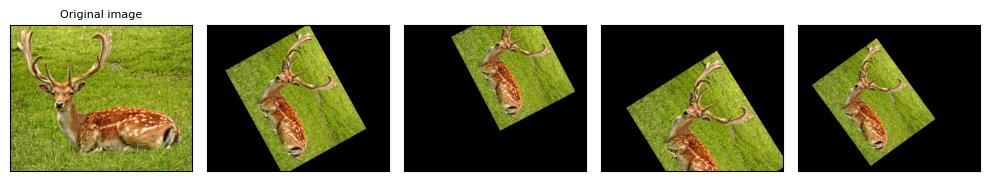

In [42]:
affine_transfomer = T.RandomAffine(degrees=(30, 70), translate=(0.1, 0.3), scale=(0.5, 0.75))
affine_imgs = [affine_transfomer(orig_img) for _ in range(4)]
plot(affine_imgs)

### ElasticTransform

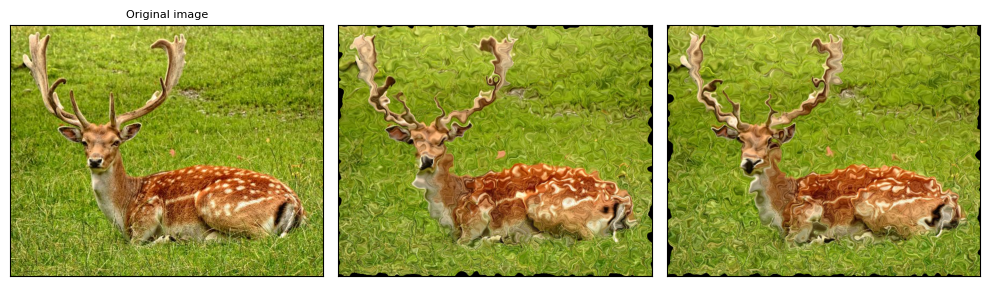

In [43]:
elastic_transformer = T.ElasticTransform(alpha=250.0)
transformed_imgs = [elastic_transformer(orig_img) for _ in range(2)]
plot(transformed_imgs)

### RandomCrop

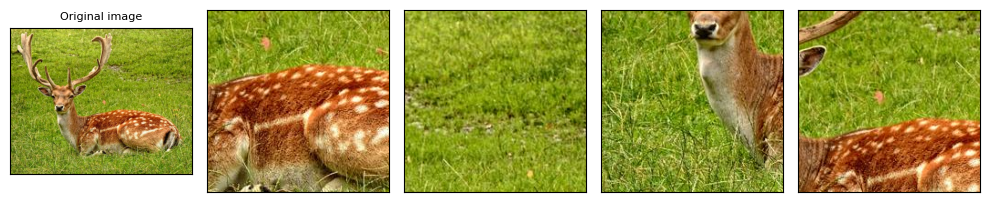

In [44]:
cropper = T.RandomCrop(size=(200, 200))
crops = [cropper(orig_img) for _ in range(4)]
plot(crops)

### RandomResizedCrop

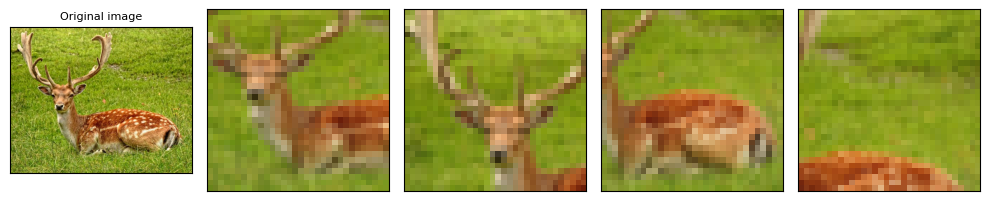

In [45]:
resize_cropper = T.RandomResizedCrop(size=(32, 32))
resized_crops = [resize_cropper(orig_img) for _ in range(4)]
plot(resized_crops)

### RandomInvert

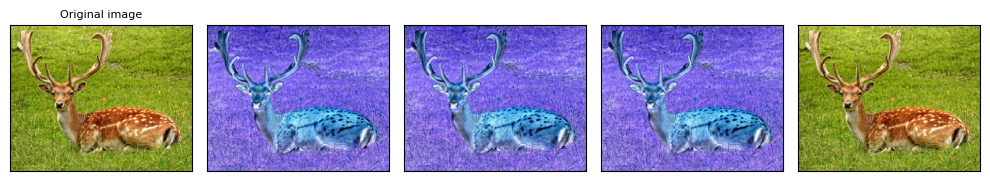

In [46]:
inverter = T.RandomInvert()
invertered_imgs = [inverter(orig_img) for _ in range(4)]
plot(invertered_imgs)

### RandomPosterize

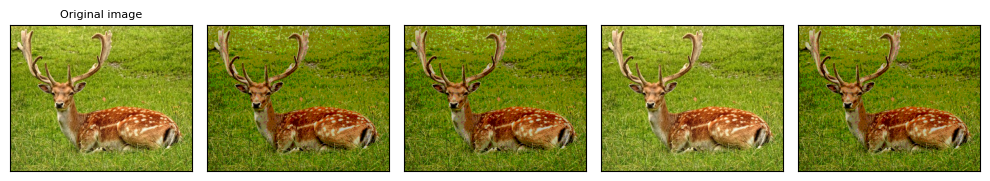

In [47]:
posterizer = T.RandomPosterize(bits=2)
posterized_imgs = [posterizer(orig_img) for _ in range(4)]
plot(posterized_imgs)

### RandomSolarize

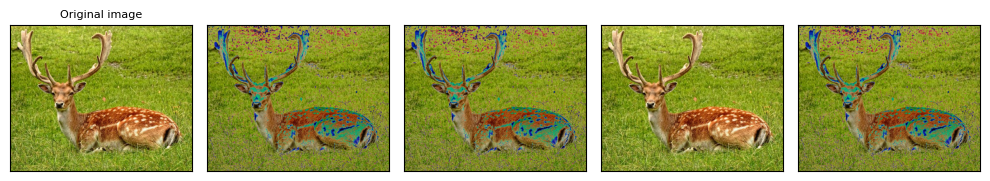

In [48]:
solarizer = T.RandomSolarize(threshold=192.0)
solarized_imgs = [solarizer(orig_img) for _ in range(4)]
plot(solarized_imgs)

### RandomAdjustSharpness

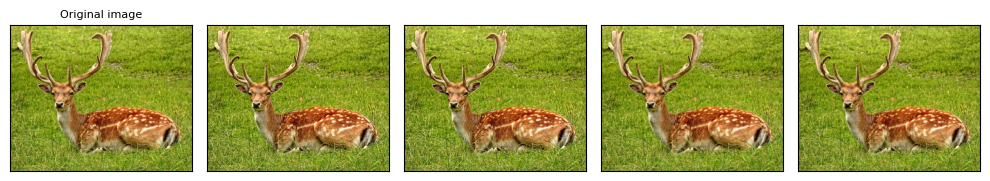

In [49]:
sharpness_adjuster = T.RandomAdjustSharpness(sharpness_factor=2)
sharpened_imgs = [sharpness_adjuster(orig_img) for _ in range(4)]
plot(sharpened_imgs)

### RandomAutocontrast

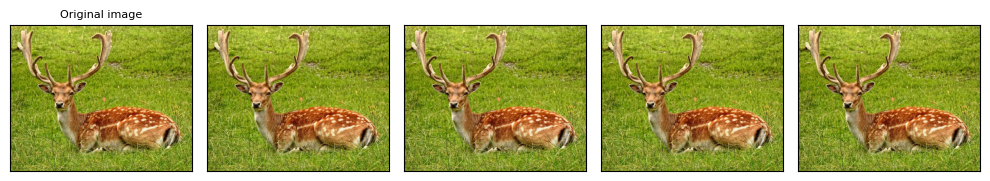

In [50]:
autocontraster = T.RandomAutocontrast()
autocontrasted_imgs = [autocontraster(orig_img) for _ in range(4)]
plot(autocontrasted_imgs)

### RandomEqualize

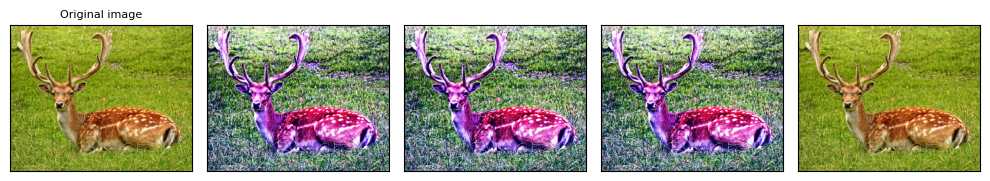

In [51]:
equalizer = T.RandomEqualize()
equalized_imgs = [equalizer(orig_img) for _ in range(4)]
plot(equalized_imgs)

### AutoAugment

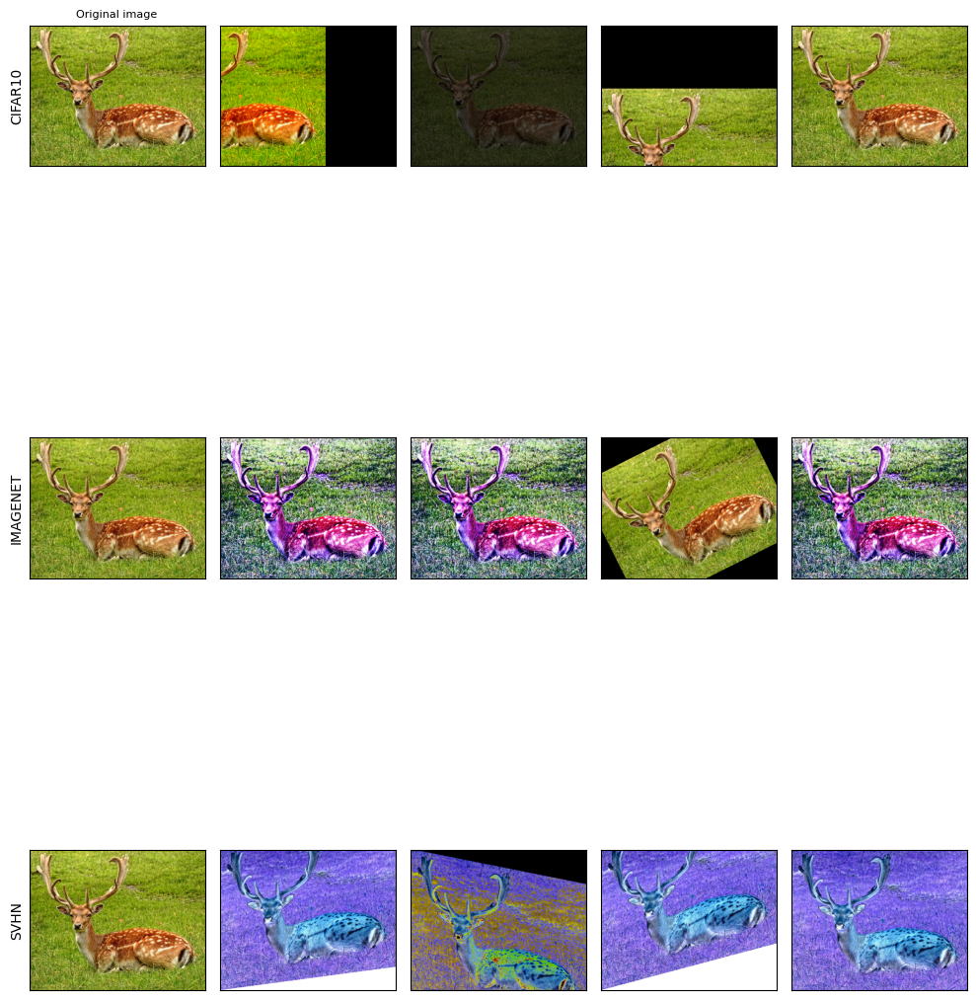

In [52]:
policies = [T.AutoAugmentPolicy.CIFAR10, T.AutoAugmentPolicy.IMAGENET, T.AutoAugmentPolicy.SVHN]
augmenters = [T.AutoAugment(policy) for policy in policies]
imgs = [
    [augmenter(orig_img) for _ in range(4)]
    for augmenter in augmenters
]
row_title = [str(policy).split('.')[-1] for policy in policies]
plot(imgs, row_title=row_title)

### RandAugment

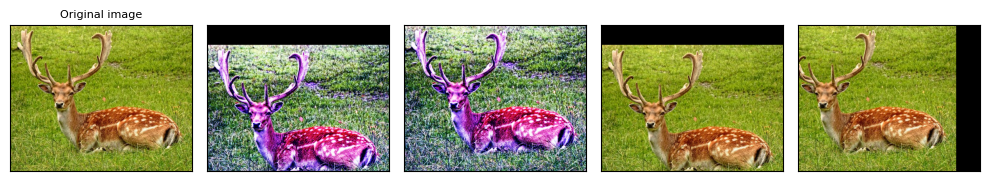

In [53]:
augmenter = T.RandAugment()
imgs = [augmenter(orig_img) for _ in range(4)]
plot(imgs)

### TrivialAugmentWide

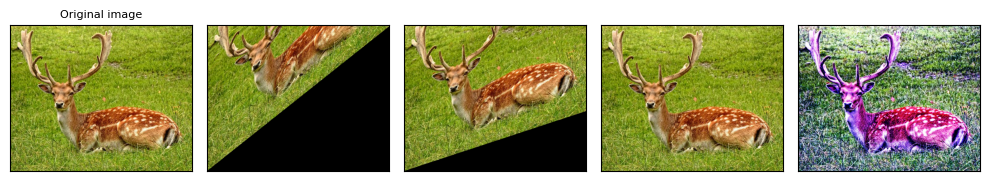

In [54]:
augmenter = T.TrivialAugmentWide()
imgs = [augmenter(orig_img) for _ in range(4)]
plot(imgs)

### AugMix

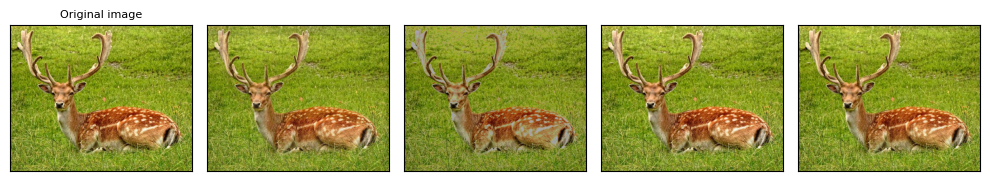

In [55]:
augmenter = T.AugMix()
imgs = [augmenter(orig_img) for _ in range(4)]
plot(imgs)

## Randomly-applied transforms

### RandomHorizontalFlip

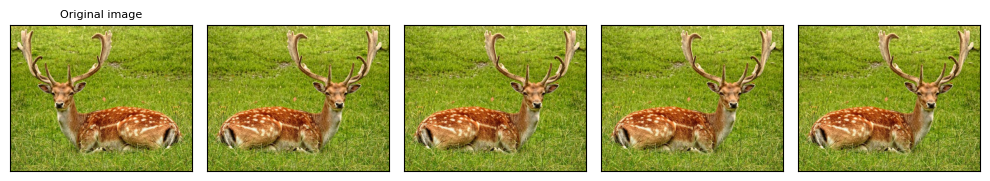

In [56]:
hflipper = T.RandomHorizontalFlip(p=0.5)
transformed_imgs = [hflipper(orig_img) for _ in range(4)]
plot(transformed_imgs)

### RandomVerticalFlip

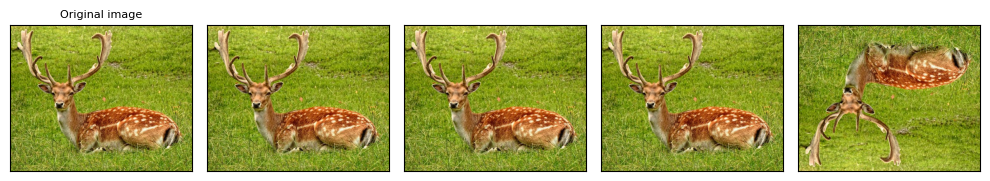

In [57]:
vflipper = T.RandomVerticalFlip(p=0.5)
transformed_imgs = [vflipper(orig_img) for _ in range(4)]
plot(transformed_imgs)

### RandomApply

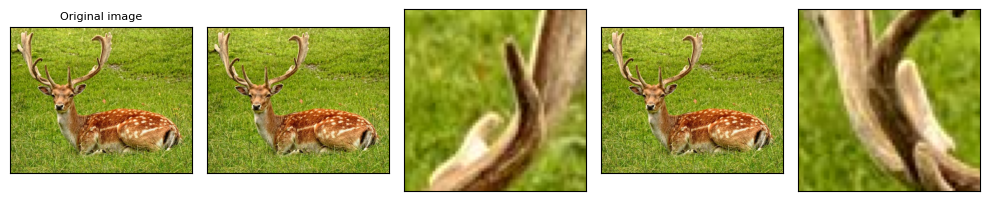

In [58]:
applier = T.RandomApply(transforms=[T.RandomCrop(size=(64, 64))], p=0.5)
transformed_imgs = [applier(orig_img) for _ in range(4)]
plot(transformed_imgs)